In [1]:
import copy
import sys

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from tqdm.auto import tqdm, trange

sys.path.append("../..")
from model import Model
from scheduler import CosineScheduler
from burgers.plot import plot_1d_image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [2]:
######### DATA #########
def initial_condition(x: torch.Tensor) -> torch.Tensor:
    # return torch.exp(2.0j * torch.pi * x).imag
    return torch.sin(2.0 * torch.pi * x)


def exact_sol(x: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
    return torch.exp(2.0j * torch.pi * x + torch.pi * 1.0j * t - 0.5 * t).imag

ic_sparsity = 1.0
pde_sparsity = 0.01
val_sparsity = 1.0
rng = np.random.default_rng(0)

# Grid
position = np.linspace(0.0, 1.0, 101, endpoint=True, dtype=np.float32)
time = np.linspace(0.0, 2.0, 2001, endpoint=True, dtype=np.float32)
xt = np.stack(np.meshgrid(position, time), axis=-1)   # [S, T, 2]

# Initial condition
ic_x = torch.tensor(xt[0, :, 0]).reshape(-1, 1)
ic_t = torch.zeros_like(ic_x)
ic_u = initial_condition(ic_x)
num_ic = int(len(ic_x) * ic_sparsity)

# PDE and data condition
pde_x = torch.tensor(xt[..., 0]).reshape(-1, 1)
pde_t = torch.tensor(xt[..., 1]).reshape(-1, 1)
pde_u = exact_sol(pde_x, pde_t)
num_pde = int(len(pde_x) * pde_sparsity)

# Validation
val_x = torch.tensor(xt[..., 0]).reshape(-1, 1)
val_t = torch.tensor(xt[..., 1]).reshape(-1, 1)
val_u = exact_sol(val_x, val_t)
num_val = int(len(val_x) * val_sparsity)


print(f"{num_ic=}, {num_pde=}, {num_val=}")

num_ic=101, num_pde=2021, num_val=202101


In [3]:
model = Model(in_dim=2, hidden_dim=32, out_dim=1).to(device)
optimizer = optim.AdamW(model.parameters(), lr=2e-4, weight_decay=1e-4)
scheduler = CosineScheduler(
    optimizer, lr_max=2e-4, period=200, warmup=0, lr_max_mult=0.5, period_mult=2.0
)

In [4]:
# epochs = []
# lrs = []
# scheduler = CosineScheduler(
#     optimizer, lr_max=1e-1, period=200, warmup=0, lr_max_mult=0.5, period_mult=2.0
# )
# for epoch in range(100000):
#     epochs.append(epoch)
#     lrs.append(optimizer.param_groups[0]["lr"])
#     scheduler.step()
# plt.plot(epochs, lrs)
# plt.yscale("log")

In [5]:
# PDE loss
def get_pde_loss(x: torch.Tensor,t: torch.Tensor, u: torch.Tensor) -> torch.Tensor:
    # du/dx - 2du/dt - u
    u_x = torch.autograd.grad(u, x, torch.ones_like(u), create_graph=True)[0]
    u_t = torch.autograd.grad(u, t, torch.ones_like(u), create_graph=True)[0]
    pde = u_x - 2*u_t - u

    return pde.square().mean()

In [6]:
### (3) Training / Fitting
epochs = 100000
best_loss = 99999999.0

loss_ic: list[float] = []
loss_pde: list[float] = []
loss_data: list[float] = []
loss_total: list[float] = []
loss_test: list[float] = []

best_model_state_dict = copy.deepcopy(model.state_dict())
model.train()
for epoch in trange(epochs):
    # Initial condition
    idx = rng.choice(len(ic_x), num_ic, replace=False)
    x = ic_x[idx].to(device)
    t = ic_t[idx].to(device)
    u = ic_u[idx].to(device)

    pred_field = model(x, t)
    mse_ic = F.mse_loss(pred_field, u)

    # PDE, data condition
    idx = rng.choice(len(pde_x), num_pde, replace=False)
    x = pde_x[idx].to(device).requires_grad_(True)
    t = pde_t[idx].to(device).requires_grad_(True)
    u = pde_u[idx].to(device)
    pred_field = model(x, t)
    mse_pde = get_pde_loss(x, t, pred_field)
    mse_data = F.mse_loss(pred_field, u)


    # update
    loss = 1.0 * mse_ic + 1.0 * mse_pde + 1e-4 * mse_data
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    scheduler.step()

    # validation
    with torch.no_grad():
        idx = rng.choice(len(val_x), num_val, replace=False)
        x = val_x[idx].to(device)
        t = val_t[idx].to(device)
        u = val_u[idx].to(device)
        pred_field = model(x, t)
        mse_test = F.mse_loss(pred_field, u).item()

        if best_loss > mse_test:
            best_loss = mse_test
            best_model_state_dict = copy.copy(model.state_dict())
            tqdm.write(f"{epoch=}, val loss: {best_loss:.4e}")

    loss_ic.append(mse_ic.item())
    loss_pde.append(mse_pde.item())
    loss_data.append(mse_data.item())
    loss_total.append(loss.item())
    loss_test.append(mse_test)

last_model_state_dict = copy.deepcopy(model.state_dict())
model.load_state_dict(best_model_state_dict)

  0%|          | 0/100000 [00:00<?, ?it/s]

epoch=0, val loss: 5.3712e-01
epoch=1, val loss: 5.2997e-01
epoch=2, val loss: 5.2290e-01
epoch=3, val loss: 5.1592e-01
epoch=4, val loss: 5.0902e-01
epoch=5, val loss: 5.0222e-01
epoch=6, val loss: 4.9551e-01
epoch=7, val loss: 4.8889e-01
epoch=8, val loss: 4.8237e-01
epoch=9, val loss: 4.7594e-01
epoch=10, val loss: 4.6960e-01
epoch=11, val loss: 4.6336e-01
epoch=12, val loss: 4.5722e-01
epoch=13, val loss: 4.5117e-01
epoch=14, val loss: 4.4522e-01
epoch=15, val loss: 4.3937e-01
epoch=16, val loss: 4.3362e-01
epoch=17, val loss: 4.2796e-01
epoch=18, val loss: 4.2240e-01
epoch=19, val loss: 4.1694e-01
epoch=20, val loss: 4.1158e-01
epoch=21, val loss: 4.0631e-01
epoch=22, val loss: 4.0115e-01
epoch=23, val loss: 3.9608e-01
epoch=24, val loss: 3.9110e-01
epoch=25, val loss: 3.8623e-01
epoch=26, val loss: 3.8145e-01
epoch=27, val loss: 3.7676e-01
epoch=28, val loss: 3.7217e-01
epoch=29, val loss: 3.6768e-01
epoch=30, val loss: 3.6328e-01
epoch=31, val loss: 3.5897e-01
epoch=32, val loss

<All keys matched successfully>

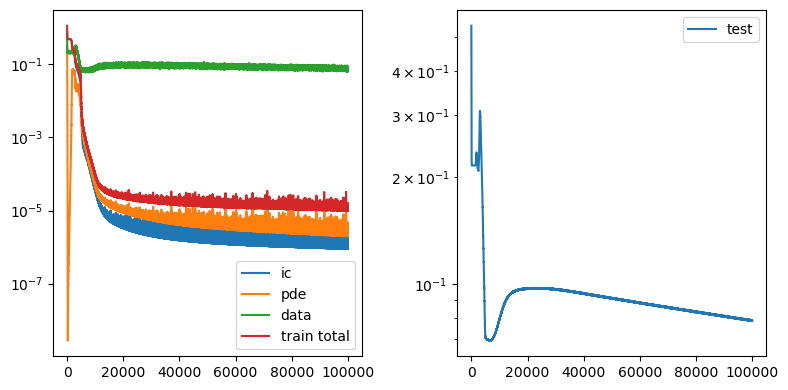

In [7]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 4))

ax1.plot(loss_ic, label="ic")
ax1.plot(loss_pde, label="pde")
ax1.plot(loss_data, label="data")
ax1.plot(loss_total, label="train total")
ax1.legend()
ax1.set_yscale("log")

ax2.plot(loss_test, label="test")
ax2.legend()
ax2.set_yscale("log")

fig.tight_layout()
fig.show()

In [8]:
xt = np.stack(np.meshgrid(position, time), axis=-1)  # [S, N, 2]
x = torch.tensor(xt[..., 0], device=device).reshape(-1, 1)
t = torch.tensor(xt[..., 1], device=device).reshape(-1, 1)

with torch.no_grad():
    model.eval()
    pred_field = model(x, t).cpu().numpy()
    true_field = exact_sol(x, t).cpu().numpy()

true_trajectory = true_field.reshape(len(time), len(position), 1)
pred_trajectory = pred_field.reshape(len(time), len(position), 1)
error = true_trajectory - pred_trajectory
print(f"MAE={np.abs(error).mean():.4e}, in range {error.min(), error.max()}")

MAE=1.3221e-01, in range (-0.99915564, 0.16232824)


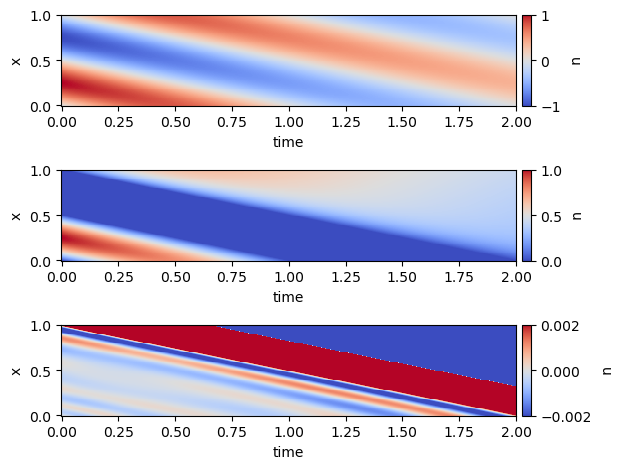

In [9]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=3)

im1 = plot_1d_image(
    ax1, time, position, true_trajectory, to_periodic=False, rasterized=True, lim=(-1.0, 1.0)
)
cbar = fig.colorbar(im1, ax=ax1, location="right", pad=0.01, aspect=10)
cbar.ax.set_ylabel("u", rotation=-90, va="bottom")
ax1.set_xlabel("time")
ax1.set_ylabel("x")

im2 = plot_1d_image(
    ax2, time, position, pred_trajectory, to_periodic=False, rasterized=True, lim=(0.0, 1.0)
)
cbar = fig.colorbar(im2, ax=ax2, location="right", pad=0.01, aspect=10)
cbar.ax.set_ylabel("u", rotation=-90, va="bottom")
ax2.set_xlabel("time")
ax2.set_ylabel("x")

im3 = plot_1d_image(
    ax3, time, position, error, to_periodic=False, rasterized=True, lim=(-0.002, 0.002)
)
cbar = fig.colorbar(im3, ax=ax3, location="right", pad=0.01, aspect=10)
cbar.ax.set_ylabel("u", rotation=-90, va="bottom")
ax3.set_xlabel("time")
ax3.set_ylabel("x")

fig.tight_layout()
fig.show()

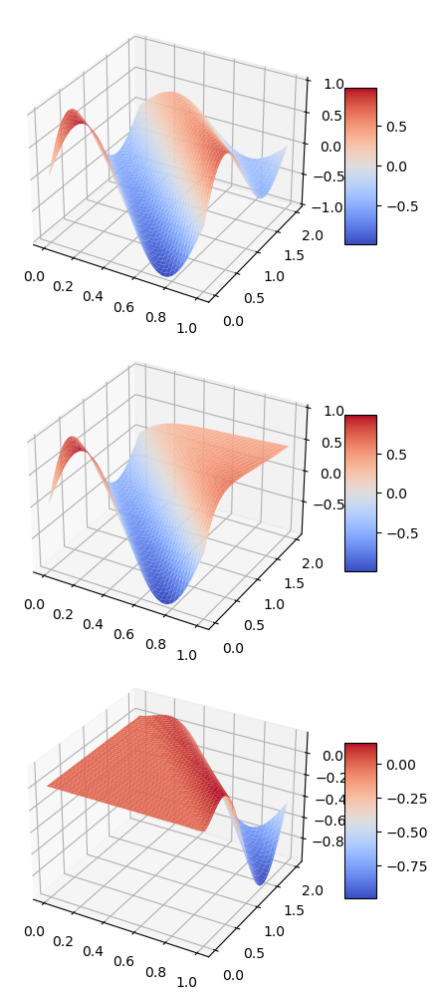

In [10]:
fig = plt.figure(figsize=(5, 10))
ax1 = fig.add_subplot(311, projection="3d")
ax2 = fig.add_subplot(312, projection="3d")
ax3 = fig.add_subplot(313, projection="3d")

surf = ax1.plot_surface(
    xt[..., 0],
    xt[..., 1],
    true_trajectory[..., 0],
    cmap="coolwarm",
)
fig.colorbar(surf, shrink=0.5, aspect=5)

surf = ax2.plot_surface(
    xt[..., 0],
    xt[..., 1],
    pred_trajectory[..., 0],
    cmap="coolwarm",
)
fig.colorbar(surf, shrink=0.5, aspect=5)

surf = ax3.plot_surface(
    xt[..., 0],
    xt[..., 1],
    error[..., 0],
    cmap="coolwarm",
)
fig.colorbar(surf, shrink=0.5, aspect=5)


fig.tight_layout()
fig.show()